## Run Decipher on T Cells <a class="tocSkip">

Load Decipher representation and trajectories and perform downstream analyses (rotations, basis decomposition, gene trajectory reconstruction).

Author: Kevin Hoffer-Hawlik

In [1]:
import warnings; warnings.simplefilter(action='ignore',)

In [2]:
warnings.simplefilter(action='ignore',)

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as colormaps
import pandas as pd
import numpy as np
import anndata as ad
import scanpy as sc
import scvi
import seaborn as sns
import scipy.stats
import pickle
import seaborn as sns
import tqdm.notebook
import torch
import pyro

from scipy import interpolate, ndimage

import decipher as dc
dc.pl.activate_journal_quality()

In [ ]:
def edit_outliers(ad, outlier_direction, k, remove = True, plot=True):
    """
    Removes visual distortions that Decipher is prone to making by removing outlier cells.
    Take outlier in 'north', 'east', 'south', or 'west' direction and place closer to global structure. 
    k refers to placement: set k = -2 to move to second largest, or k = 1 for second smallest.
    Set remove parameter to true if desiring to remove datapoint.
    """
    ad = ad.copy()
    decipher_v = ad.obsm['decipher_v'] # first index is the cell, second index is decipher_v1 (0) or decipher_v2 (1)
    
    if outlier_direction == 'north':
        index = decipher_v[:,1].argmax() # largest value in decipher_v2 span
        fix_value = np.partition(decipher_v[:,1], k)[k] # second largest value
        ad.obsm['decipher_v'][index,1] = fix_value
    elif outlier_direction == 'east':
        index = decipher_v[:,0].argmax() # largest value in decipher_v1 span
        fix_value = np.partition(decipher_v[:,0], k)[k] # second largest value
        ad.obsm['decipher_v'][index,0] = fix_value
    elif outlier_direction == 'south':
        index = decipher_v[:,1].argmin() # smallest value in decipher_v2 span
        fix_value = np.partition(decipher_v[:,1], k)[k] # second smallest value
        ad.obsm['decipher_v'][index,1] = fix_value
    elif outlier_direction == 'west':
        index = decipher_v[:,0].argmin() # smallest value in decipher_v1 span
        fix_value = np.partition(decipher_v[:,0], k)[k] # second smallest value
        ad.obsm['decipher_v'][index,0] = fix_value
        
    if remove:
        mask = np.full((ad.shape[0],),True)
        mask[index] = False
        ad = ad[mask,:]
    
    if plot:
        sc.pl.embedding(ad, basis='decipher_v')
    return ad

# Load data and reorganize configuration setups

In [ ]:
# load Decipher representation and trained model -- need to reconfigure uns in adata architecture
adata = sc.read_h5ad('_decipher_models/2024-02-29-18-34-43-tcells_rerun/tcells.h5ad')

In [9]:
# reorganizing configuration setup in anndata dict
adata.uns['decipher']['config']['dim_z'] = adata.uns['decipher']['config']['latent_dim']
adata.uns['decipher']['config']['dim_v'] = adata.uns['decipher']['config']['pre_latent_dim']

del adata.uns['decipher']['config']['context']
del adata.uns['decipher']['config']['latent_dim']
del adata.uns['decipher']['config']['pre_latent_dim']
del adata.uns['decipher']['config']['scale_factor']

config = dc.tl.DecipherConfig(**adata.uns["decipher"]["config"])
config.initialize_from_adata(adata)

adata.uns['decipher']['config'] = config.to_dict()

KeyError: 'latent_dim'

In [88]:
def edit_state_dict(state_dict):
    for _ in range(len(state_dict)):
        key, value = state_dict.popitem(False)
        key = key.replace('p','v')
        state_dict[key] = value

def decipher_load_model(adata):
    model_config = dc.tl.DecipherConfig(**adata.uns["decipher"]["config"])
    model = dc.tl._decipher.Decipher(model_config)
    model_run_id = adata.uns["decipher"]["run_id"]
    save_folder = dc.utils.DECIPHER_GLOBALS["save_folder"]
    full_path = os.path.join(save_folder, model_run_id)
    state_dict = torch.load(os.path.join(full_path, "decipher_model.pt"))
    edit_state_dict(state_dict)
    model.load_state_dict(state_dict)
    model.eval()
    return model
model = decipher_load_model(adata)

V5


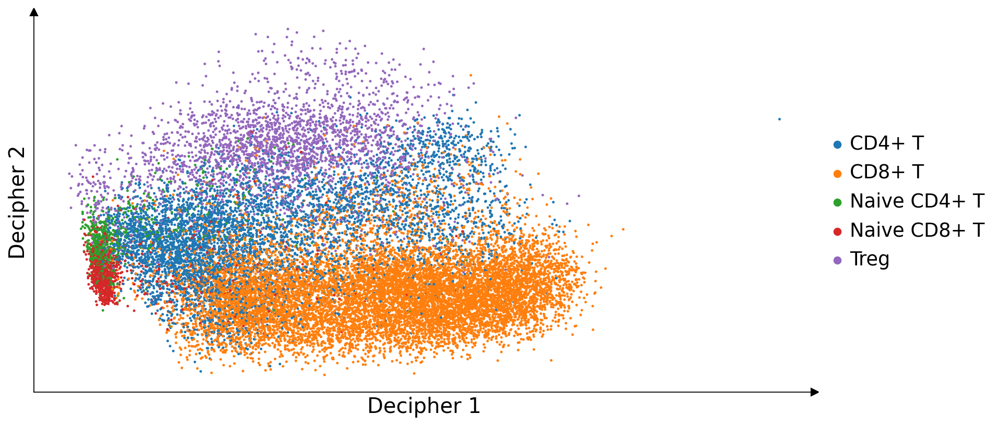

In [10]:
dc.pl.decipher(adata, color = 'cell_type_khh', figsize = (12,6), s=20);

In [104]:
dc.tl._decipher.decipher_save_model(adata, model, overwrite=True)

model_run_id = adata.uns["decipher"]["run_id"]
save_folder = dc.utils.DECIPHER_GLOBALS["save_folder"]
full_path = os.path.join(save_folder, model_run_id)
adata.write_h5ad(os.path.join(full_path, 'tcells.h5ad'))

# refine visualization, construct trajectories

In [7]:
adata = sc.read_h5ad('_decipher_models/2024-02-29-18-34-43-tcells_rerun/tcells.h5ad')

## explore decipher V space

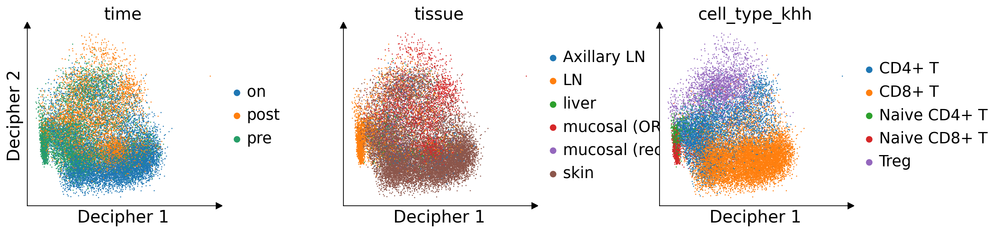

In [9]:
fig1 = dc.pl.decipher(adata, ['time','tissue','cell_type_khh'], wspace=.5, ncols=4)

### make rotations

In [12]:
adata = edit_outliers(adata, 'east', 1, remove = True, plot=False)

In [13]:
replace = {'CD4+ T'  : 'CD4',
           'Naive CD4+ T' : 'CD4',
           'Treg' : 'Treg',
           'CD8+ T' : 'CD8',
           'Naive CD8+ T' : 'CD8',}
adata.obs['marker_type'] = adata.obs['cell_type_khh'].replace(replace)

replace = {'CD4+ T'  : 'Mature',
           'Naive CD4+ T' : 'Naive',
           'Treg' : 'Mature',
           'CD8+ T' : 'Mature',
           'Naive CD8+ T' : 'Naive',}
adata.obs['naive_type'] = adata.obs['cell_type_khh'].replace(replace)

V5


2024-04-10 17:44:53,519 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2024-04-10 17:44:53,520 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.


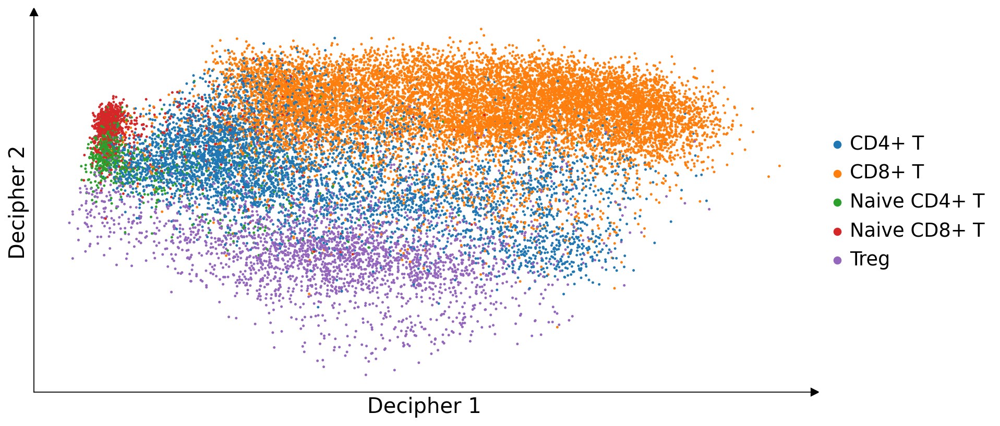

In [ ]:
dc.tl.decipher_rotate_space(adata,
    # v2_col = 'marker_type', v2_order = ['Treg','CD4','CD8'],
    # v1_col = 'naive_type', v1_order = ['Naive','Mature'] 
) # regenerate u and v latent dimensions from model

def vertical_rotation(adata, auto_flip_decipher_z = True):
    # see decipher_rotate_spacesource code for full logic/architecture
    best_rotation = np.array([[1, 0], [0, -1]])

    adata.obsm["decipher_v_not_rotated"] = adata.obsm["decipher_v"].copy()
    adata.obsm["decipher_v"] = adata.obsm["decipher_v"] @ best_rotation
    adata.uns["decipher"]["rotation"] = best_rotation

    if auto_flip_decipher_z:
        # flip each z to be correlated positively with the components
        dim_z = adata.obsm["decipher_z"].shape[1]
        z_v_corr = np.corrcoef(adata.obsm["decipher_z"], y=adata.obsm["decipher_v"], rowvar=False)
        z_sign_correction = np.sign(z_v_corr[:dim_z, dim_z:].sum(axis=1))
        adata.obsm["decipher_z_not_rotated"] = adata.obsm["decipher_z"].copy()
        adata.obsm["decipher_z"] = adata.obsm["decipher_z"] * z_sign_correction

vertical_rotation(adata) # perform simple vertical rotation (see source code for full logic/architecture)

dc.pl.decipher(adata, ['cell_type_khh'], figsize = (12,6),s=20);

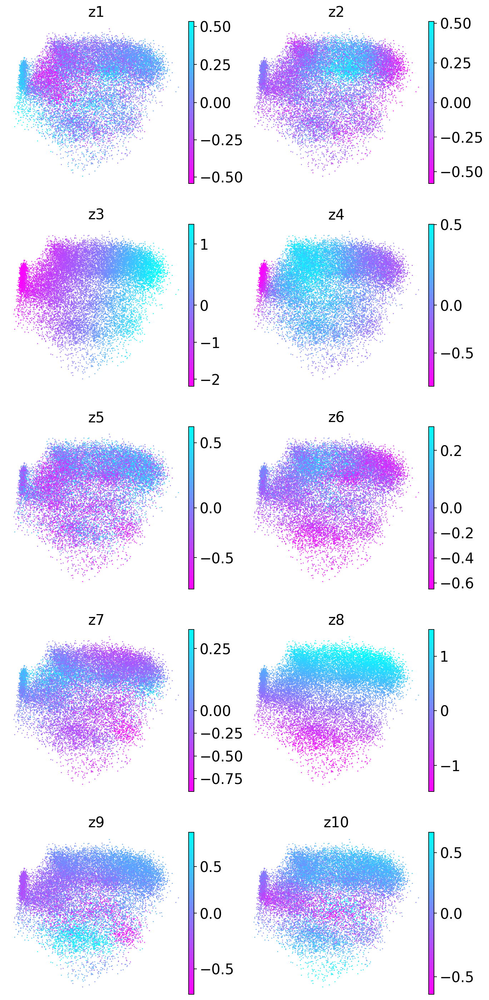

In [16]:
# plot all of decipher z dimensions
# fig, ax = plt.subplots(figsize=(12,6))
dc.pl.decipher_z(adata, ncols=2, vcenter=0);

## Trajectory analysis [import trajectories and decipher_time from previous notebook]

In [134]:
adata_tmp = ad.read_h5ad('tcells_decipher_trajectories_091123.h5ad')
adata.uns['decipher_trajectories'] = adata_tmp.uns['decipher_trajectories']
adata.obs['decipher_time'] = adata_tmp.obs['decipher_time']
del adata_tmp

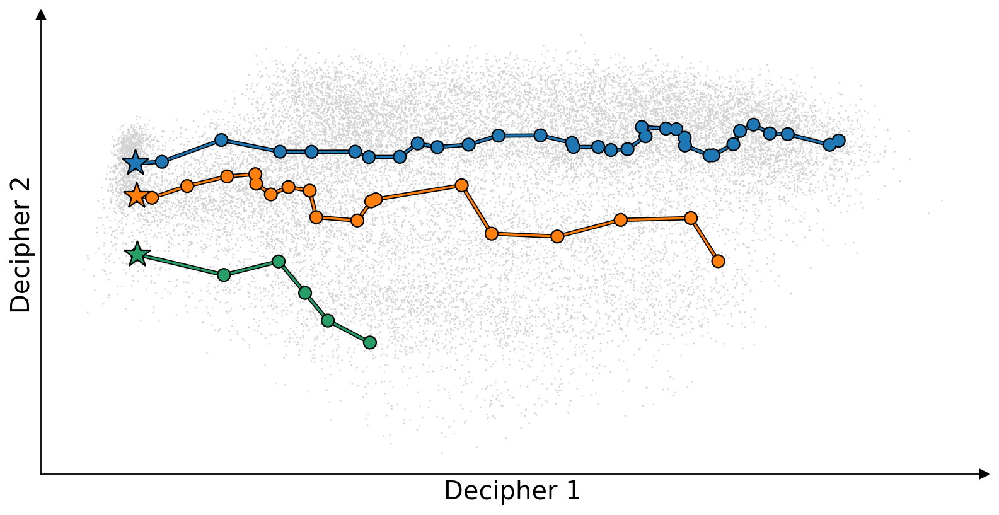

In [135]:
for trajectory in adata.uns['decipher_trajectories'].keys():
    dict_key = trajectory.split('=')[1]
    adata.uns['decipher']['trajectories'][dict_key] = {}
    adata.uns['decipher']['trajectories'][dict_key]['points'] = adata.uns['decipher_trajectories'][trajectory]['points']
    adata.uns['decipher']['trajectories'][dict_key]['times'] = adata.uns['decipher_trajectories'][trajectory]['times']
    adata.uns['decipher']['trajectories'][dict_key]['cluster_locations'] = adata.uns['decipher_trajectories'][trajectory]['checkpoints']

fig = dc.pl.trajectories(adata)
fig.set_size_inches(12, 6)

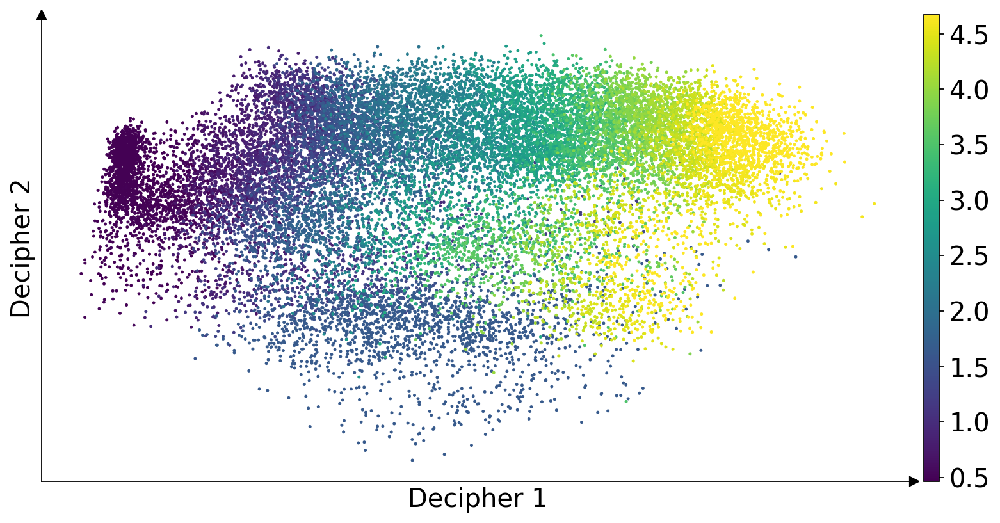

In [137]:
fig = dc.pl.decipher_time(adata, figsize = (12,6), s=20)

# Basis decomposition and reconstructed gene trajectories using decipher_time

## Create reconstructed gene trajectories over decipher_time

In [138]:
# send trajectory points through decoders and sample to get distributions of gene expression
dc.tl.gene_patterns(adata)

V5


In [142]:
adata.uns['decipher']['gene_patterns']['CD8']['mean'].shape # decipher_time times x genes

(51, 8170)

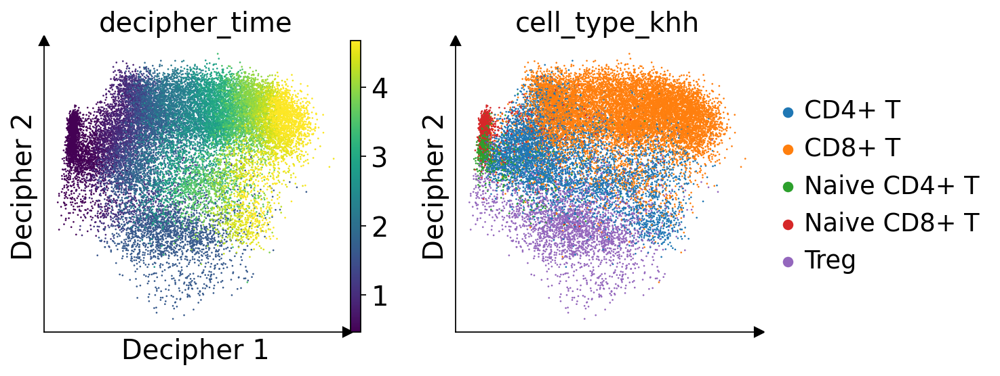

In [ ]:
dc.pl.decipher(adata, ['decipher_time','cell_type_khh'])
cell_type_palette = adata.uns['cell_type_khh_colors']

### Visualize gene trajectories and signatures over pseudotime

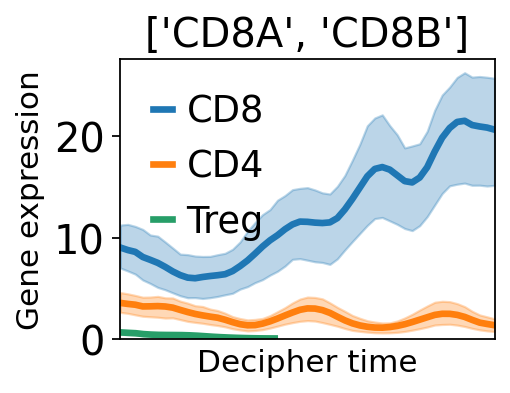

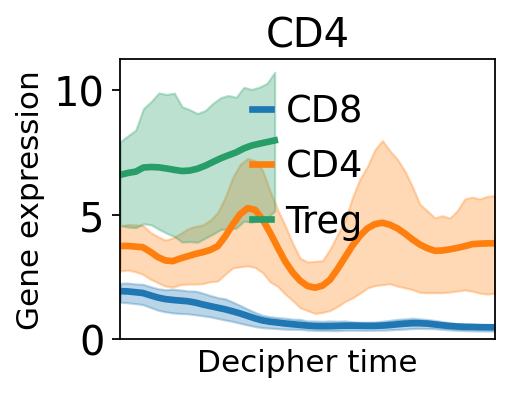

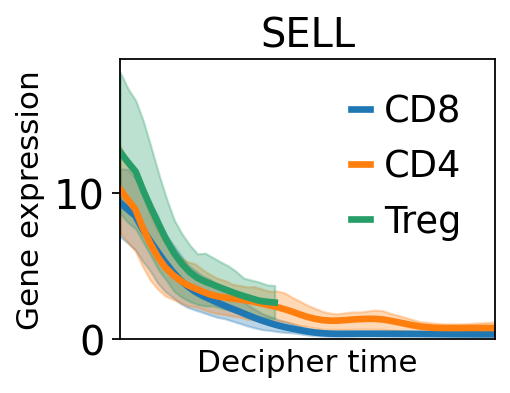

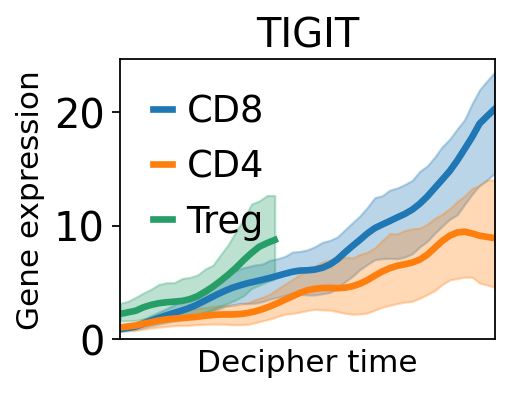

In [156]:
_ = dc.pl.gene_patterns(adata, ['CD8A','CD8B'] )
_ = dc.pl.gene_patterns(adata, 'CD4', )
_ = dc.pl.gene_patterns(adata, 'SELL', )
_ = dc.pl.gene_patterns(adata, 'TIGIT', )

## Train basis decomposition model

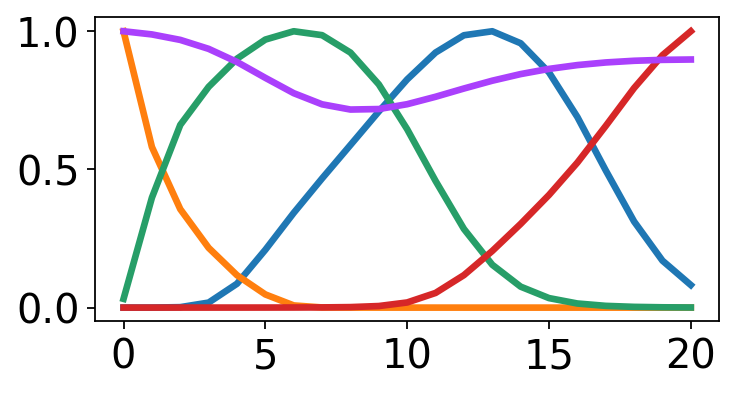

Loss: -364735.3 - Relative Error: 1.17%:  65%|█████████████████████████████████████████▌                      | 6486/10000 [06:50<03:42, 15.80it/s]


In [157]:
training_losses = dc.tl.basis_decomposition(adata, seed=0, plot_every_k_epochs=100) # =-2)

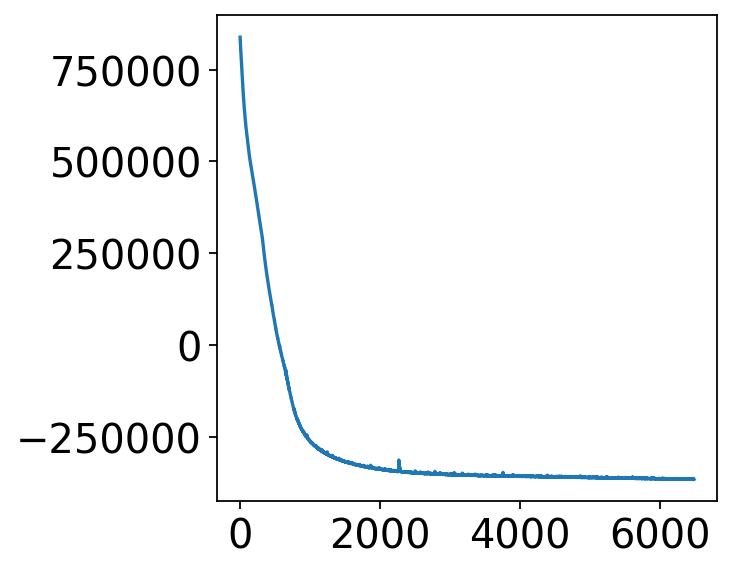

In [158]:
sns.lineplot(training_losses);

In [159]:
dc.tl.disruption_scores(adata)
adata.var[[c for c in adata.var if "decipher_disruption" in c]].sort_values(
    "decipher_disruption_combined", ascending=False
).head(10)

2024-04-10 21:18:02,982 | INFO : Added `.var['decipher_disruption_shape']`: shape disruption scores
2024-04-10 21:18:02,982 | INFO : Added `.var['decipher_disruption_scale']`: scale disruption scores
2024-04-10 21:18:02,983 | INFO : Added `.var['decipher_disruption_combined']`: combined disruption scores
2024-04-10 21:18:02,990 | INFO : Added `.uns['decipher']['disruption_scores']`: disruption scores
2024-04-10 21:18:02,991 | INFO : Added `.uns['decipher']['disruption_scores_samples']`: disruption scores probabilistic samples


,decipher_disruption_shape,decipher_disruption_scale,decipher_disruption_combined
index,,,
LINC02073,0.674534,2.930383,7.629870
AL021937.3,0.232451,4.070990,7.266004
AC068196.1,0.183812,3.551620,7.178704
PKP2,0.273694,1.496299,7.089962
CASR,0.573540,2.521209,7.082929
AL353152.2,0.592350,1.703598,6.795848
TRDC,0.516506,2.212843,6.784257
AC010754.1,0.551474,2.413476,6.766625
NPR3,0.498898,2.083652,6.728246


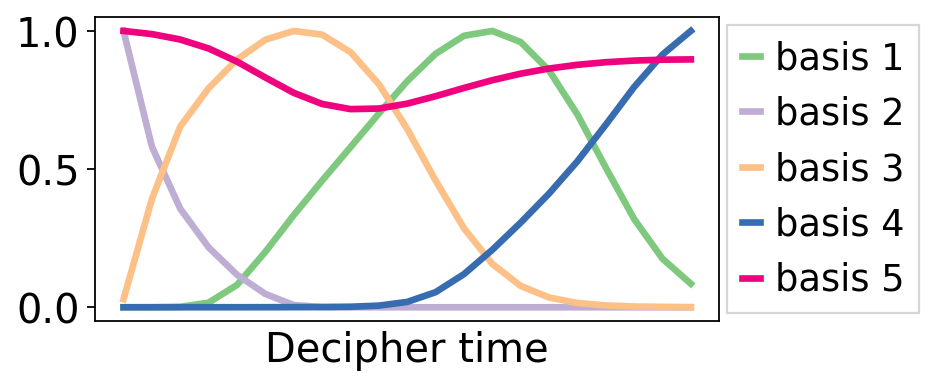

In [161]:
colors = [sns.color_palette("Accent")[i] for i in [0, 1, 2, 4, 5]]
fig = dc.pl.basis(adata, colors=colors, linewidth = [3,3,3,3,3])
fig.axes[0].set_xticks([]);
fig.axes[0].set_xlabel('Decipher time');

In [160]:
adata.write('tcells_decipher_041024.h5ad')

# examine decipher latent space and pseudotime correlations

To examine bucketing of CD8/CD4 T cells along trajectory for cell-cell interaction inference analyses

## T cells from all patients

See contact_tracing prep notebook for final T cell decipher_time segmentations

In [32]:
# adata = sc.read_h5ad('tcells_decipher_041024.h5ad')

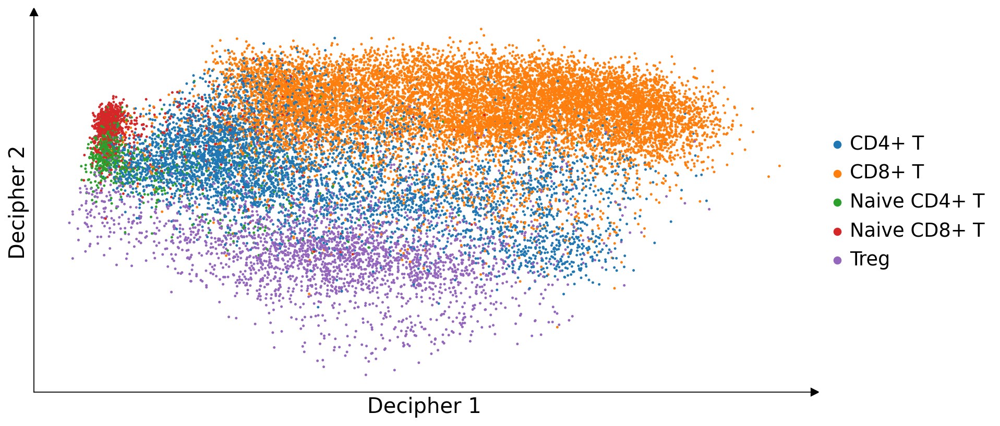

In [33]:
dc.pl.decipher(adata, color='cell_type_khh', figsize=(12,6), s=20);

<Axes: xlabel='decipher_time', ylabel='z1'>

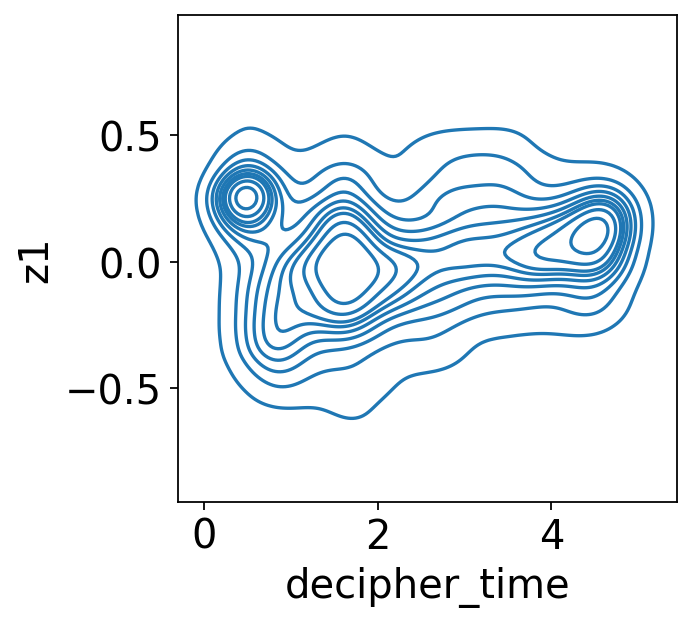

In [34]:
df = adata.obs.loc[:,['decipher_time','z1', 'z2', 'z3', 'z4', 'z5', 'z6', 'z7', 'z8', 'z9', 'z10']]
sns.kdeplot(df, x='decipher_time', y='z1')

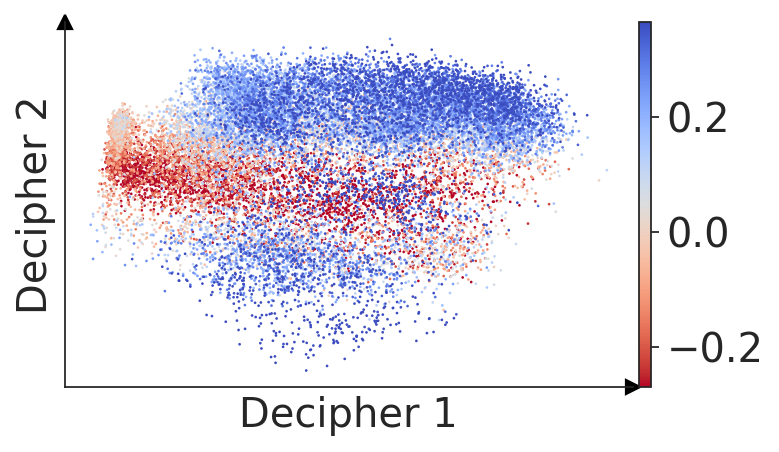

In [36]:
dc.pl.decipher(adata, color='z10', cmap='coolwarm_r', vmin='p10',vmax='p90', figsize=(5,3));

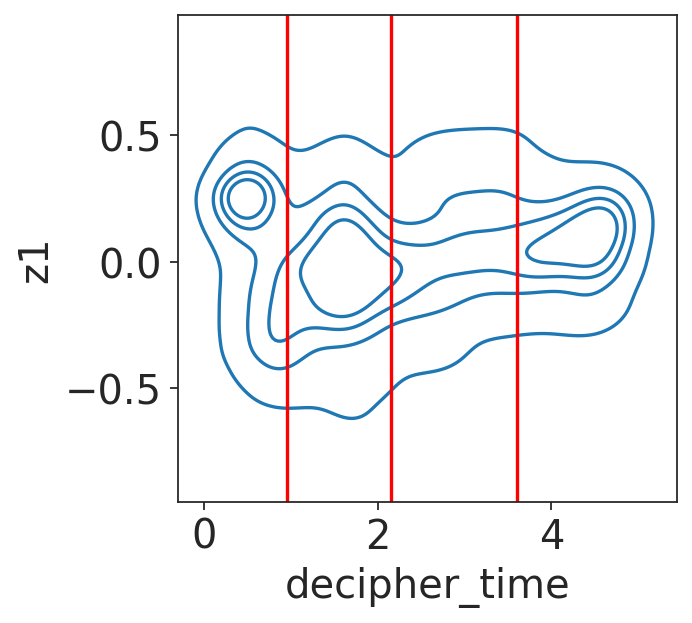

In [37]:
cutoff1 = .95
cutoff2 = 2.15
cutoff3 = 3.6

sns.kdeplot(df, x='decipher_time', y='z1', levels=5)
plt.axvline(cutoff1,0,1, color='red')
plt.axvline(cutoff2,0,1, color='red')
plt.axvline(cutoff3,0,1, color='red')

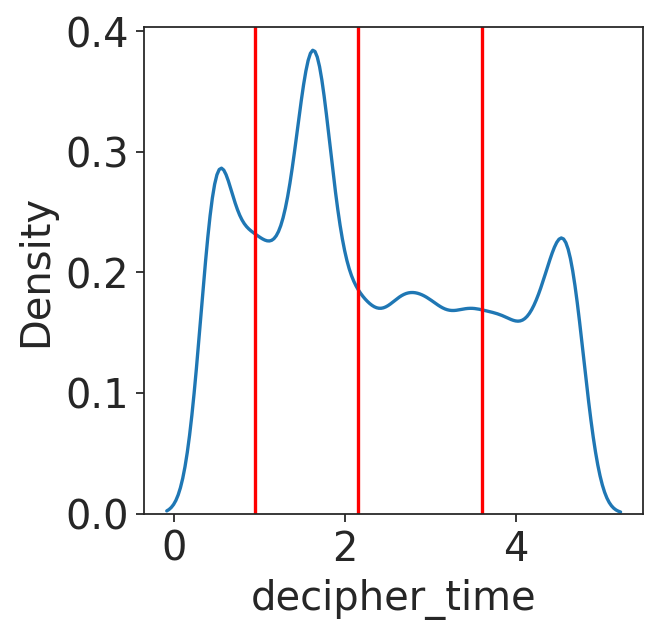

In [38]:
sns.kdeplot(df, x='decipher_time')
plt.axvline(cutoff1,0,1, color='red')
plt.axvline(cutoff2,0,1, color='red')
plt.axvline(cutoff3,0,1, color='red')

In [39]:
adata.obs['dpt_buckets'] = 1
adata.obs.loc[adata.obs.decipher_time > cutoff1,'dpt_buckets'] = 2
adata.obs.loc[adata.obs.decipher_time > cutoff2,'dpt_buckets'] = 3
adata.obs.loc[adata.obs.decipher_time > cutoff3,'dpt_buckets'] = 4

<Axes: xlabel='decipher_time', ylabel='Count'>

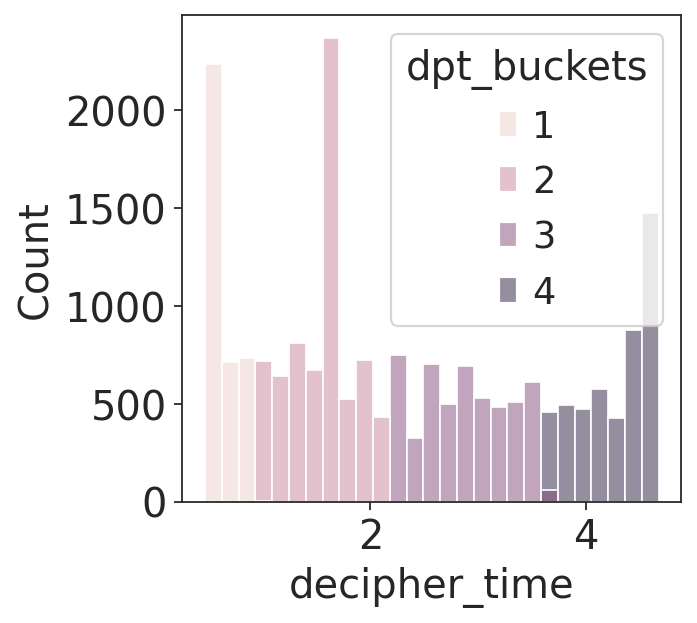

In [40]:
sns.histplot(adata.obs,x='decipher_time',hue='dpt_buckets')

<Axes: xlabel='dpt_buckets', ylabel='Count'>

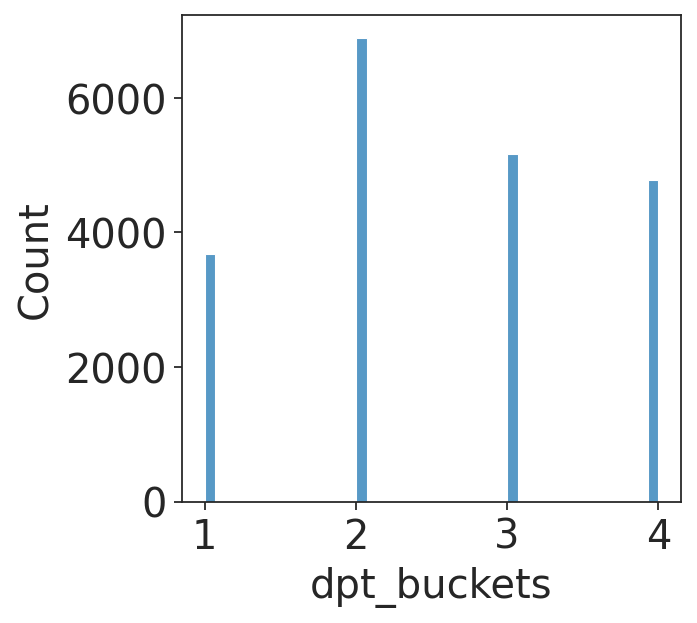

In [41]:
sns.histplot(adata.obs, x='dpt_buckets')

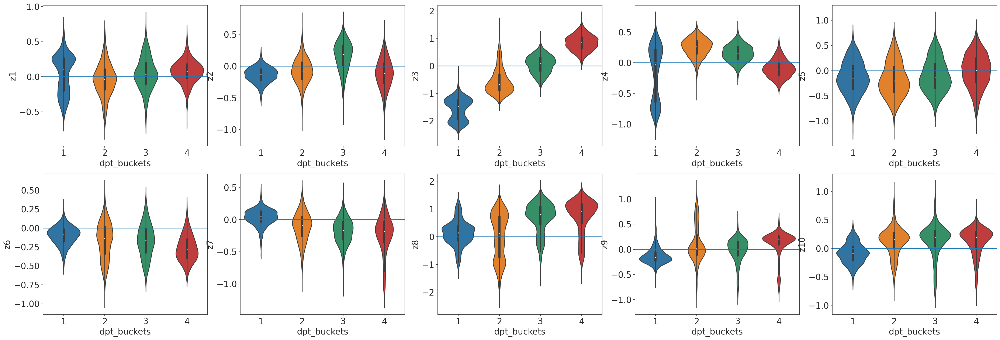

In [42]:
fig,axs = plt.subplots(2,5, figsize=(36,12))
for i,z in enumerate(['z1', 'z2', 'z3', 'z4', 'z5', 'z6', 'z7', 'z8', 'z9', 'z10']):
    sns.violinplot(adata.obs, x='dpt_buckets',y=z,ax=axs[i//5,i%5])
    axs[i//5,i%5].axhline(0)

## T cells from patients with paired samples (CT experiment)

See contact_tracing prep notebook for final T cell decipher_time segmentations

In [43]:
adata_subset = adata[adata.obs['patient'].isin(['R310', 'R319', 'F01', 'F02', 'F03', 'F16', 'F12'])]
adata_subset.shape

(10441, 8170)

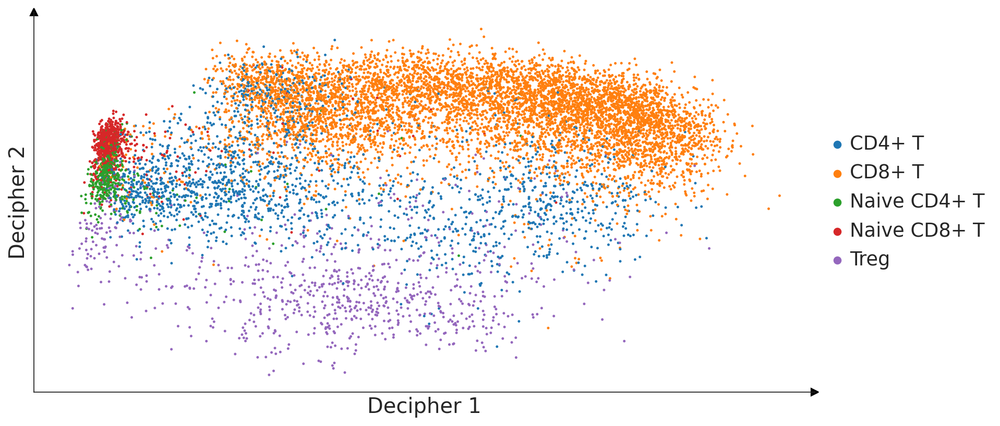

In [44]:
dc.pl.decipher(adata_subset, color='cell_type_khh', figsize=(12,6), s=20);

<Axes: xlabel='decipher_time', ylabel='z1'>

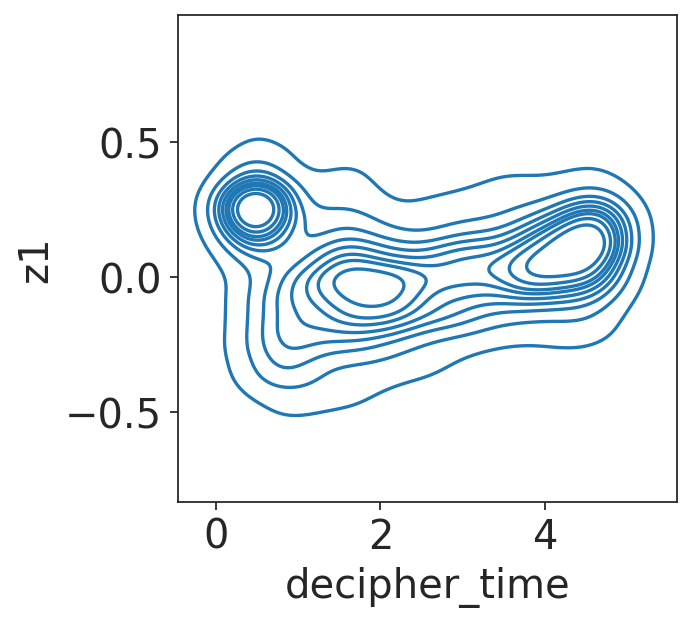

In [48]:
df = adata_subset.obs.loc[:,['decipher_time','z1', 'z2', 'z3', 'z4', 'z5', 'z6', 'z7', 'z8', 'z9', 'z10']]
sns.kdeplot(df, x='decipher_time', y='z1')

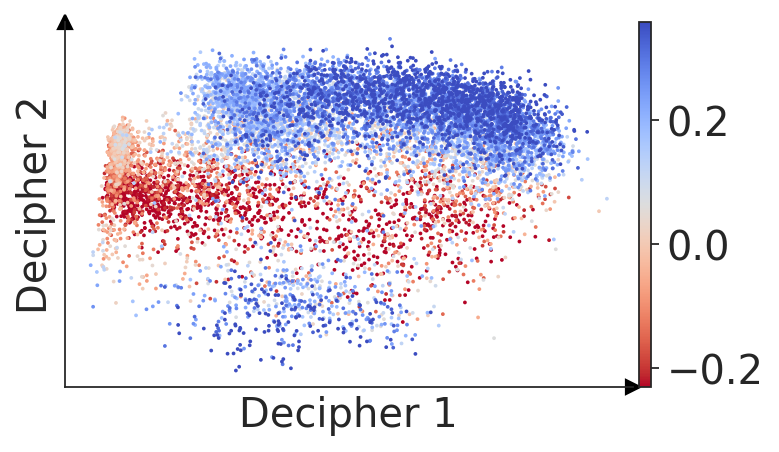

In [50]:
dc.pl.decipher(adata_subset, color='z10', cmap='coolwarm_r', vmin='p10',vmax='p90', figsize=(5,3));

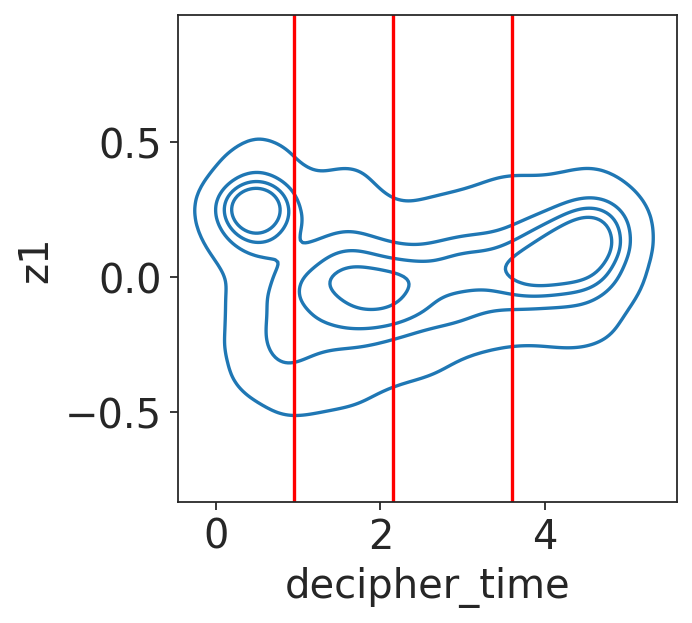

In [51]:
cutoff1 = .95
cutoff2 = 2.15
cutoff3 = 3.6

sns.kdeplot(df, x='decipher_time', y='z1', levels=5)
plt.axvline(cutoff1,0,1, color='red')
plt.axvline(cutoff2,0,1, color='red')
plt.axvline(cutoff3,0,1, color='red')

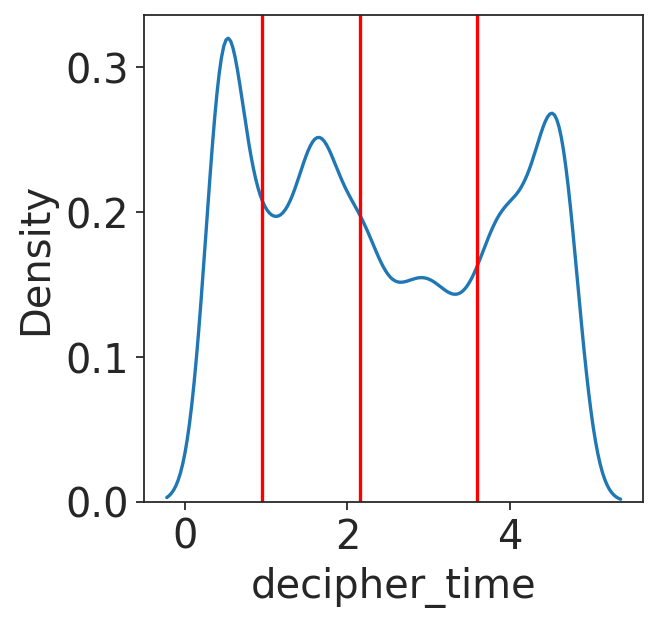

In [52]:
sns.kdeplot(df, x='decipher_time')
plt.axvline(cutoff1,0,1, color='red')
plt.axvline(cutoff2,0,1, color='red')
plt.axvline(cutoff3,0,1, color='red')

In [53]:
adata_subset.obs['dpt_buckets'] = 1
adata_subset.obs.loc[adata.obs.decipher_time > cutoff1,'dpt_buckets'] = 2
adata_subset.obs.loc[adata.obs.decipher_time > cutoff2,'dpt_buckets'] = 3
adata_subset.obs.loc[adata.obs.decipher_time > cutoff3,'dpt_buckets'] = 4

<Axes: xlabel='decipher_time', ylabel='Count'>

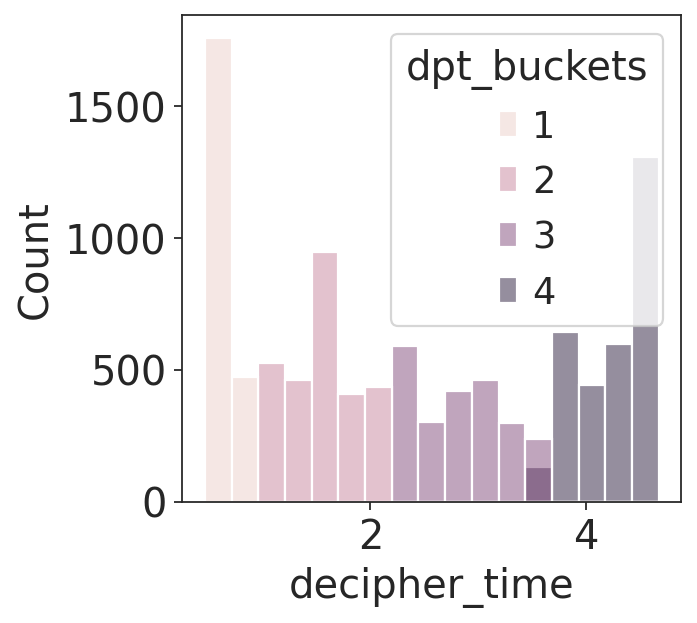

In [54]:
sns.histplot(adata_subset.obs,x='decipher_time',hue='dpt_buckets')

<Axes: xlabel='dpt_buckets', ylabel='Count'>

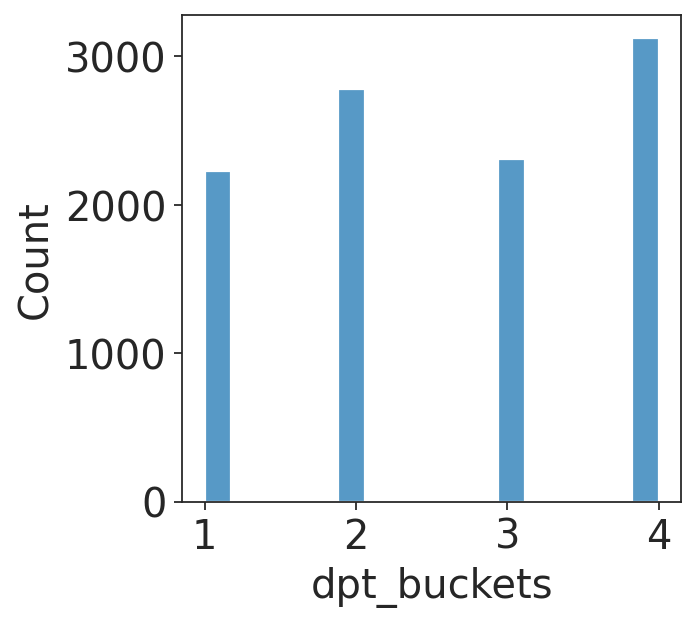

In [55]:
sns.histplot(adata_subset.obs, x='dpt_buckets')

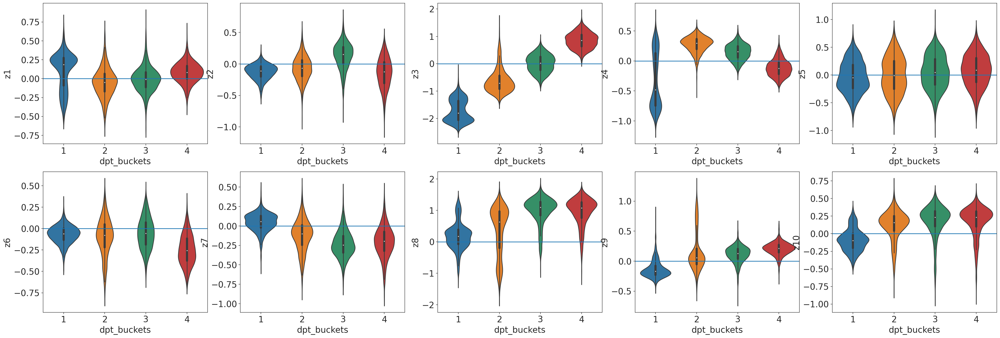

In [56]:
fig,axs = plt.subplots(2,5, figsize=(36,12))
for i,z in enumerate(['z1', 'z2', 'z3', 'z4', 'z5', 'z6', 'z7', 'z8', 'z9', 'z10']):
    sns.violinplot(adata_subset.obs, x='dpt_buckets',y=z,ax=axs[i//5,i%5])
    axs[i//5,i%5].axhline(0)

<Axes: xlabel='dpt_buckets', ylabel='Count'>

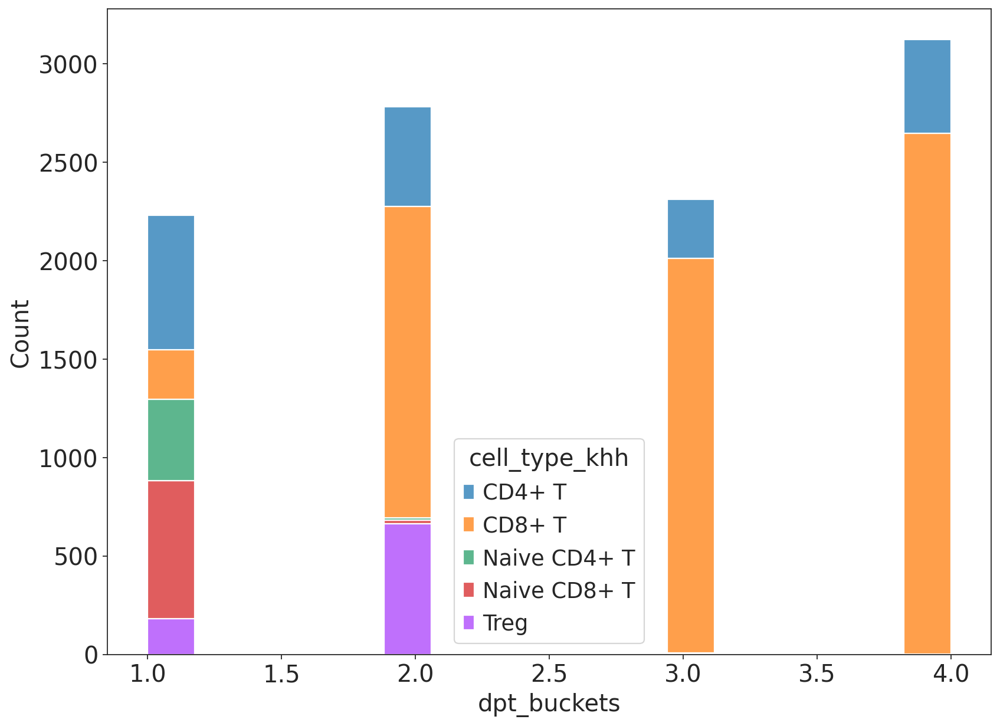

In [61]:
plt.subplots(figsize=(12,9))
sns.histplot(adata_subset.obs, x='dpt_buckets', hue='cell_type_khh', multiple='stack')

In [66]:
adata_subset.obs.loc[:,['cell_type_khh','dpt_buckets']].value_counts(sort=False)

cell_type_khh  dpt_buckets
CD4+ T         1               681
               2               506
               3               298
               4               476
CD8+ T         1               251
               2              1580
               3              2004
               4              2643
Naive CD4+ T   1               416
               2                11
               3                 4
               4                 2
Naive CD8+ T   1               700
               2                20
               3                 4
               4                 1
Treg           1               181
               2               663
Name: count, dtype: int64

In [70]:
# adata_subset.obs.loc[:,['dpt_buckets']].to_csv('tcells_decipher_dpt_bucket_labels_051424.csv')